In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
import os
import math


In [2]:
image1 = cv2.imread('panorama_dataset/image1.png')
image2 = cv2.imread('panorama_dataset/image2.png')

h1, w1 = image1.shape[:2]
h2, w2 = image2.shape[:2]

rgb_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
rgb_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

In [3]:
def histogram(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv], [0, 1, 2], None, (8,8,8), [0, 180, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

In [4]:
folder_path = "panorama_dataset/"
image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')]

In [5]:
features = []
images = []
for file in image_files:
    img = cv2.imread(file)
    images.append(img)
    hist = histogram(img)
    features.append(hist)

features = np.array(features)

k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(features)

c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


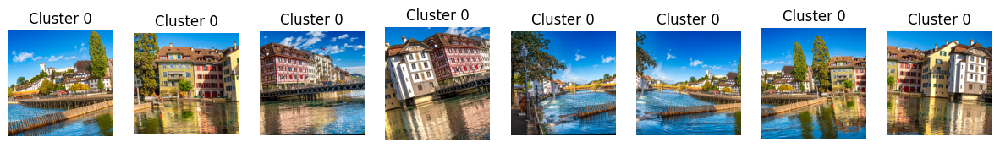

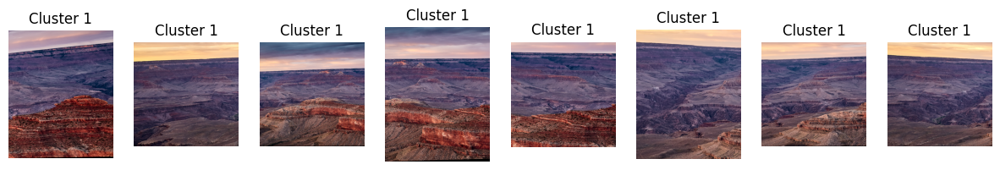

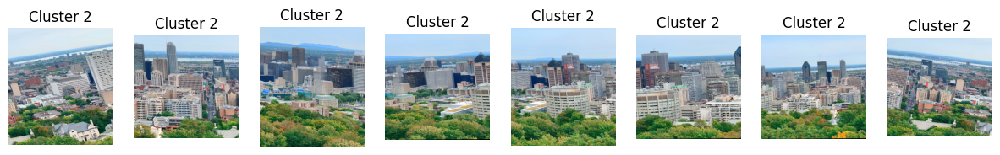

In [6]:
for cluster in range(k):
    cluster_idx = np.where(labels == cluster)[0]
    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(cluster_idx):
        plt.subplot(1, len(cluster_idx), i+1)
        plt.imshow(cv2.cvtColor(images[idx], cv2.COLOR_BGR2RGB))
        plt.title(f"Cluster {cluster}")
        plt.axis("off")
    plt.show()

In [7]:
sift = cv2.SIFT_create()

kp1, desc1 = sift.detectAndCompute(image1, None)
kp2, desc2 = sift.detectAndCompute(image2, None)

In [8]:
def verify_homography(H):
    det = np.linalg.det(H[0:2, 0:2])

    if H is None or det<= 1e-3:
        return False

    return True

In [9]:
img_kp1 = cv2.drawKeypoints(rgb_image1, kp1, None)
img_kp2 = cv2.drawKeypoints(rgb_image2, kp2, None)

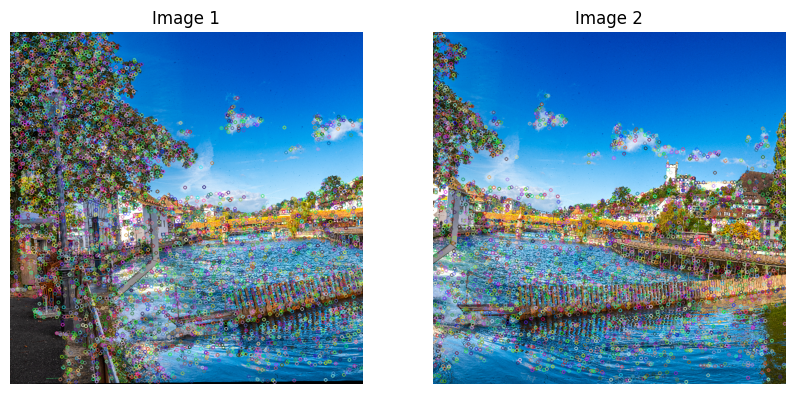

In [10]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_kp1)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_kp2)
plt.title('Image 2')
plt.axis('off')
plt.show()

In [11]:
def get_dist(obj):
    return obj.distance

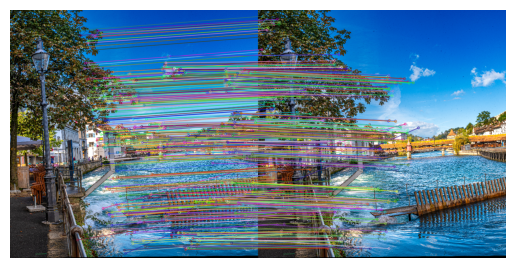

In [12]:
bf = cv2.BFMatcher()

matches_bf = bf.knnMatch(desc1, desc2, k=2)

match_mask_bf = []
for a,b in matches_bf:
    if a.distance < 0.7*b.distance:
        match_mask_bf.append([a])
 
match_img = cv2.drawMatchesKnn(rgb_image1,kp1,rgb_image1,kp2,match_mask_bf,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(match_img)
plt.axis("off")
plt.show()



In [13]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict()

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches_flann = flann.knnMatch(desc1,desc2,k=2)

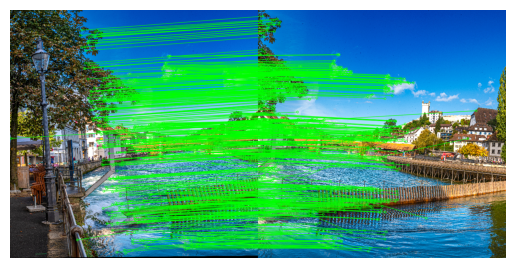

In [14]:
match_mask = []

for i in range(len(matches_flann)):
    match_mask.append([0,0])

for i, (a,b) in enumerate(matches_flann):
    if a.distance < 0.7*b.distance:
        match_mask[i] = [1,0]

match_img_flann = cv2.drawMatchesKnn(rgb_image1, kp1, rgb_image2, kp2, matches_flann, None, matchColor = (0, 255, 0), matchesMask = match_mask, flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(match_img_flann)
plt.axis("off")
plt.show()

In [15]:
src = []
dest = []

for i in match_mask_bf:
    img_match = i[0]
    src_pt = np.float32(kp1[img_match.queryIdx].pt).reshape(-1,1,2)
    dest_pt = np.float32(kp2[img_match.trainIdx].pt).reshape(-1,1,2)

    src.append(src_pt)
    dest.append(dest_pt)

src = np.vstack(src)
dest = np.vstack(dest)

In [16]:
H, mask = cv2.findHomography(
    src, dest,
    cv2.RANSAC,
    5.0
)

pd.DataFrame(H).to_csv("2021555_homography.csv", header= False, index = False)

print("Homography Matrix (H):")
print(H)

Homography Matrix (H):
[[ 8.98950781e-01 -1.31348248e-01 -1.64400129e+02]
 [ 1.43082735e-01  9.90633132e-01 -6.93808374e+01]
 [-1.02059934e-07  3.06692828e-07  1.00000000e+00]]


In [17]:
warped_image1 = cv2.warpPerspective(image1, H, (w1 + w2, max(h1, h2)))

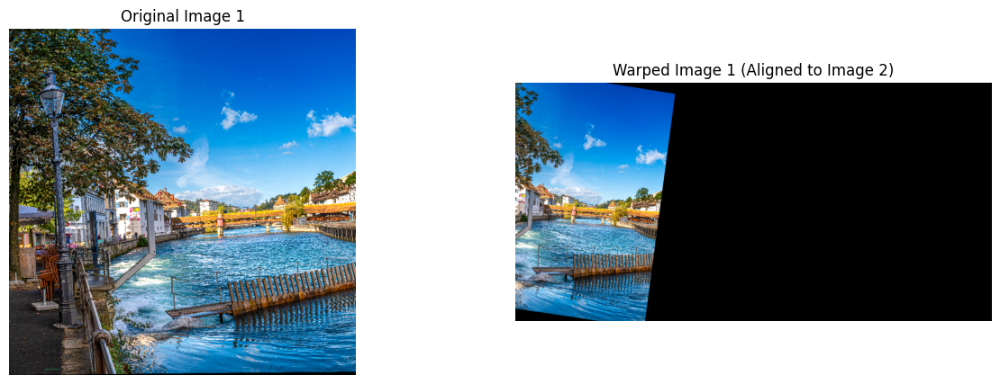

In [18]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title("Original Image 1")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(warped_image1, cv2.COLOR_BGR2RGB))
plt.title("Warped Image 1 (Aligned to Image 2)")
plt.axis('off')

plt.show()

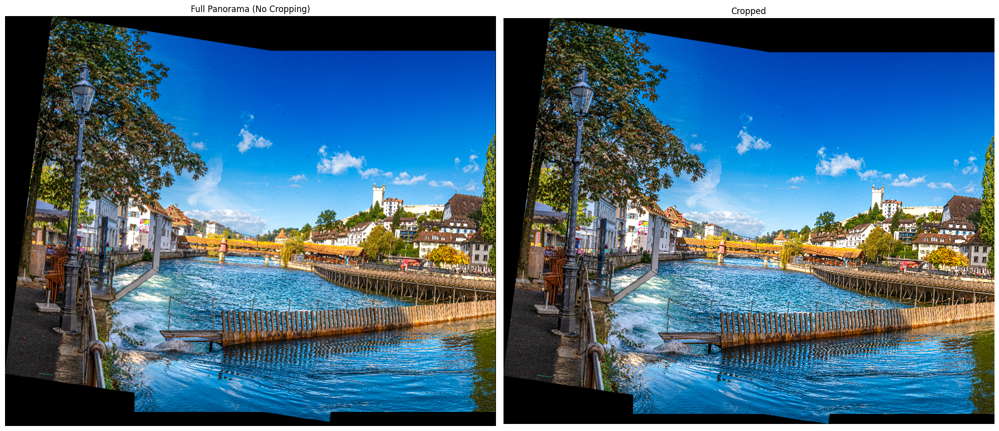

In [19]:
def calculate_panorama_size(image1, image2, H):
    h1, w1 = image1.shape[:2]
    h2, w2 = image2.shape[:2]
    

    corners = np.array([[0, 0, 1], [w1, 0, 1], [0, h1, 1], [w1, h1, 1]])
    warped_corners = H @ corners.T
    warped_corners = warped_corners[:2] / warped_corners[2]
    
    x_min = min(warped_corners[0].min(), 0)
    x_max = max(warped_corners[0].max(), w2)
    y_min = min(warped_corners[1].min(), 0)
    y_max = max(warped_corners[1].max(), h2)
    
    if x_min<0:
        tx = -x_min
    else:
        tx = 0

    if y_min<0:
        ty = -y_min
    else:
        ty = 0
    
    width = int(np.ceil(x_max - x_min))
    height = int(np.ceil(y_max - y_min))
    
    return width, height, tx, ty

panorama_width, panorama_height, tx, ty = calculate_panorama_size(image1, image2, H)

tx = int(tx)
ty = int(ty)

H_adj = H.copy()
H_adj[0, 2] += tx
H_adj[1, 2] += ty

warped_image = cv2.warpPerspective(image1, H_adj, (panorama_width, panorama_height))

panorama = warped_image.copy()
image2_y = ty
image2_x = tx
panorama[image2_y:image2_y+image2.shape[0], 
         image2_x:image2_x+image2.shape[1]] = image2

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.title("Full Panorama (No Cropping)")
plt.axis('off')

gray_pano = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
_, thresh_pano = cv2.threshold(gray_pano, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh_pano, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

cropped_panorama = panorama 

if contours:
    all_points = np.concatenate(contours, axis=0)
    x, y, w, h = cv2.boundingRect(all_points)

    if w > 0 and h > 0: 
        cropped_panorama = panorama[y:y+h, x:x+w]

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(cropped_panorama, cv2.COLOR_BGR2RGB))
plt.title("Cropped")
plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
def sort_images(image_list):

    sift = cv2.SIFT_create()
    bf = cv2.BFMatcher()

    ordered_list = [image_list[0]]
    remaining_images = image_list[1:]

    curr_img = ordered_list[0]
    isEmp = False

    while remaining_images:
        best_match = -1
        best_idx = -1
        img_count = 0

        kp_base, des_base = sift.detectAndCompute(curr_img, None)

        for i, next_img in enumerate(remaining_images):
            kp_next, des_next = sift.detectAndCompute(next_img, None)

            matches = bf.knnMatch(des_base, des_next, k=2)

            if img_count == 24:
                isEmp= True

            good_matches = []
            if matches:
                valid_matches = [m_pair for m_pair in matches if len(m_pair) == 2]
                for m, n in valid_matches:
                    if m.distance < 0.7 * n.distance:
                        good_matches.append(m)

            num_good_matches = len(good_matches)

            if num_good_matches > best_match:
                best_match = num_good_matches
                best_idx = i

            img_count+=1

        if best_idx != -1:
            best_next = remaining_images.pop(best_idx)
            ordered_list.append(best_next)
            curr_img = best_next

    return ordered_list

def find_kp(img1, img2):
    sift = cv2.SIFT_create()
    kp1, desc1 = sift.detectAndCompute(img1, None)
    kp2, desc2 = sift.detectAndCompute(img2, None)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(desc1, desc2, k=2)

    good_matches = []
    if matches:
        valid_matches = [m_pair for m_pair in matches if len(m_pair) == 2]
        for a, b in valid_matches:
            if a.distance < 0.7 * b.distance:
                good_matches.append(a)

    return kp1, desc1, kp2, good_matches


def find_homography(kp1, kp2, good_matches, min_match_count=8):
    a,b = None, None

    if len(good_matches) < min_match_count:
        return a,b

    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    if not verify_homography(H):
        return a,b
        
    return H, mask
flag = 0
img_count=0

def warp(img1, img2, H, img_count=0):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    img_count = img_count

    if img_count>25:
        flag = 2
        # print("fatt gya")

    corners_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    warped_corners = cv2.perspectiveTransform(corners_img1, H)
    

    corners_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    all_corners = np.concatenate((warped_corners, corners_img2), axis=0)

    x, y, w, h = cv2.boundingRect(all_corners.reshape(-1, 2))
    # print(x,y,w,h)

    trans = [-x, -y]
    H_trans = np.array([[1, 0, trans[0]], [0, 1, trans[1]], [0, 0, 1]])

    

    # print(trans)
    # print(H_trans)

    op_w = w
    op_h = h

    warped_img1 = cv2.warpPerspective(img1, H_trans.dot(H), (op_w, op_h))
    panorama = np.zeros((op_h, op_w, 3), dtype=np.uint8)

    img2_start_x, img2_start_y = max(0, trans[0]), max(0, trans[1])
    img2_end_x, img2_end_y = min(op_w, trans[0] + w2), min(op_h, trans[1] + h2)
    img2_x = slice(img2_start_x, img2_end_x)
    img2_y = slice(img2_start_y, img2_end_y)

    if img_count<24:
        flag = 0
        # print("kam hai")

    if img2_x.start < img2_x.stop and img2_y.start < img2_y.stop:
        if flag == 0:
            img2_cropped = img2[0:(img2_end_y - img2_start_y), 0:(img2_end_x - img2_start_x)]
            panorama[img2_y, img2_x] = img2_cropped

    gray = cv2.cvtColor(warped_img1, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    panorama = cv2.copyTo(warped_img1, mask, panorama)

    return panorama

def crop(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    all_points = np.concatenate(contours, axis=0)
    x, y, w, h = cv2.boundingRect(all_points)

    y_end = min(y + h, image.shape[0])
    x_end = min(x + w, image.shape[1])
    y_start = max(0, y)
    x_start = max(0, x)

    return image[y_start:y_end, x_start:x_end]

def stitch_images(image_list):
    panorama = image_list[0].copy()

    for i in range(1, len(image_list)):
        next_image = image_list[i]

        kp_next, _, kp_pano, good_matches = find_kp(next_image, panorama)
        H, _ = find_homography(kp_next, kp_pano, good_matches)

        if H is None:
            continue
        
        # img_count+=1
        panorama = warp(next_image, panorama, H)

    final_panorama = crop(panorama)
    return final_panorama


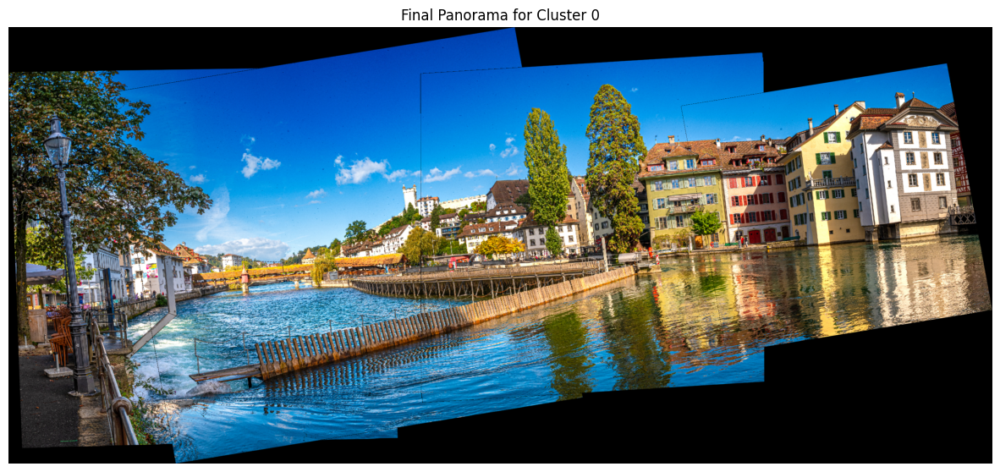

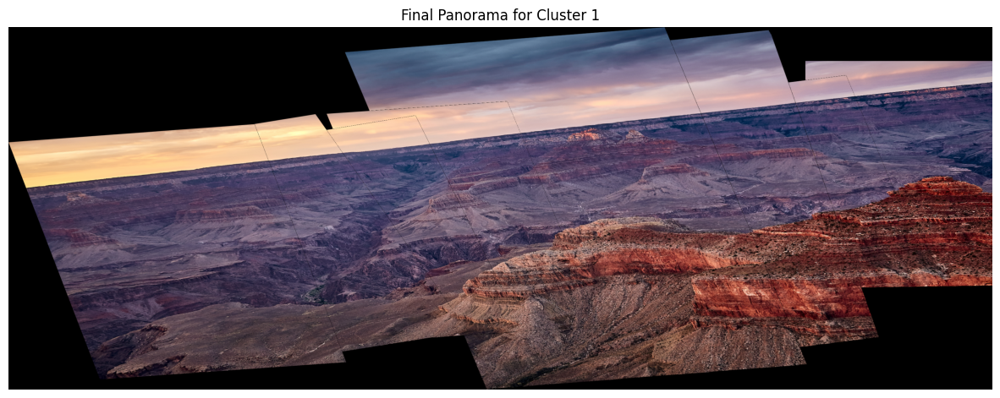

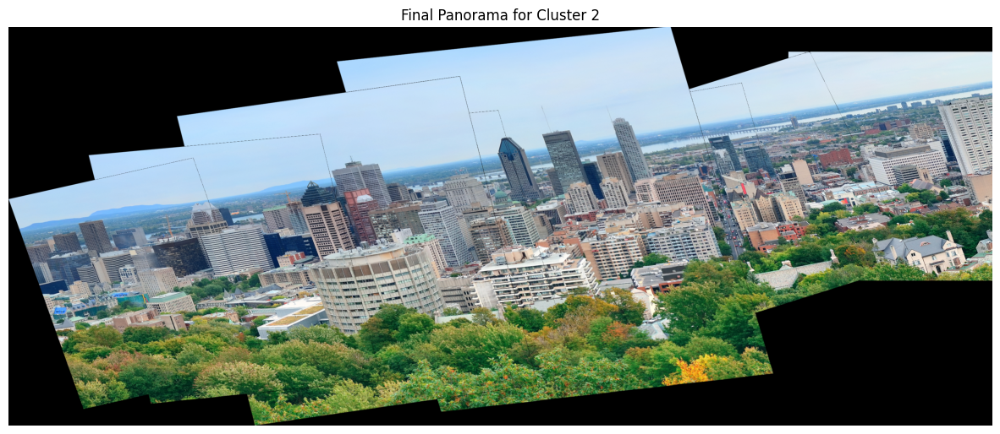

In [23]:
stitched_panoramas = []

for cluster_id in range(k):
    cluster_indices = np.where(labels == cluster_id)[0]

    images_in_cluster = []
    for i in cluster_indices:
        if i < len(images):
            images_in_cluster.append(images[i])

    if cluster_id == 0:
        images_to_stitch = images_in_cluster
    else:
        images_to_stitch = sort_images(images_in_cluster)

    cluster_panorama = stitch_images(images_to_stitch)

    stitched_panoramas.append(cluster_panorama)
    plt.figure(figsize=(15, 7))
    plt.imshow(cv2.cvtColor(cluster_panorama, cv2.COLOR_BGR2RGB))
    plt.title(f"Final Panorama for Cluster {cluster_id}")
    plt.axis("off")
    plt.show()
